# BSD68 Denoising Dataset

In [1]:
!pip install torchsummary


Defaulting to user installation because normal site-packages is not writeable


In [2]:
import os

current_dir = os.getcwd()
print("Current directory:", current_dir)

Current directory: /home/mkang2/Convolutional-Nearest-Neighbor/Testing


In [3]:
# Torch
import torch 
import torch.nn as nn
import torch.nn.functional as F
from torch import optim 
from torchsummary import summary
from torchvision.transforms import v2
import numpy as np


# Train + Data 
import sys 
sys.path.append('../Layers')
from Conv1d_NN import *
from Conv2d_NN import *
from Conv1d_NN_spatial import * 

from Conv2d_NN_spatial import * 
from ConvNN_CNN_Branching import *

sys.path.append('../Data')
from BSD68 import NoisyBSD68_dataset, test_denoise_visual_BSD


sys.path.append('../Models')
from denoising_models import DenoisingCNN, DenoisingBranching_ConvNN_2D_Spatial_K_N, DenoisingBranching_ConvNN_2D_K_N, DenoisingConvNN_2D_K_N

sys.path.append('../Train')
from train2d import train_denoising_model, evaluate_denoising_accuracy, evaluate_accuracy_psnr


import numpy as np


In [4]:
noisybsd68 = NoisyBSD68_dataset(batch_size=32, noise_std=0.3, train_count=200, test_count=40, target_size=256)

In [5]:
print(len(noisybsd68.train_data))
print(len(noisybsd68.test_data))
print(len(noisybsd68.test_data[0]))
print(noisybsd68.train_data[0][0].shape)


200
40
3
torch.Size([1, 256, 256])


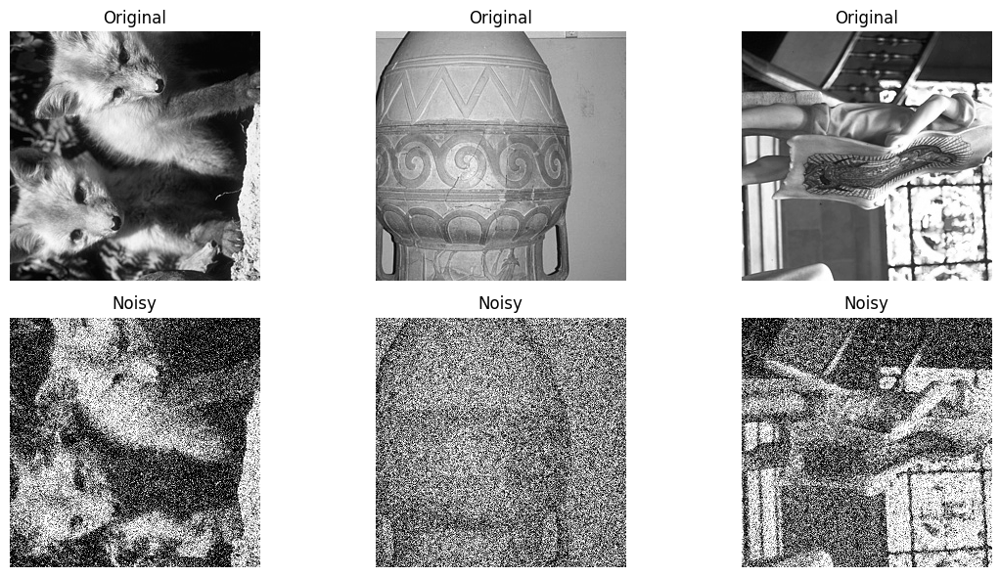

In [6]:
noisybsd68.visual(3)

### Control CNN Model



Epoch 1, Time: 0.47439098358154297, Loss: 0.11056312838835376
Epoch 2, Time: 0.194962739944458, Loss: 0.03000490926206112
Epoch 3, Time: 0.19628381729125977, Loss: 0.015524130181542464
Epoch 4, Time: 0.20172500610351562, Loss: 0.01660995850605624
Epoch 5, Time: 0.1951158046722412, Loss: 0.011611721079264368
Epoch 6, Time: 0.192626953125, Loss: 0.011324928940406867
Epoch 7, Time: 0.19734835624694824, Loss: 0.010209208620446069
Epoch 8, Time: 0.1921985149383545, Loss: 0.009721305221319199
Epoch 9, Time: 0.1946406364440918, Loss: 0.009545751714280673
Epoch 10, Time: 0.19683027267456055, Loss: 0.009444831604404109

 Average epoch time: 0.22361230850219727
Average loss on test set: 0.009048683103173971
Average PSNR on test set: 20.645021438598633


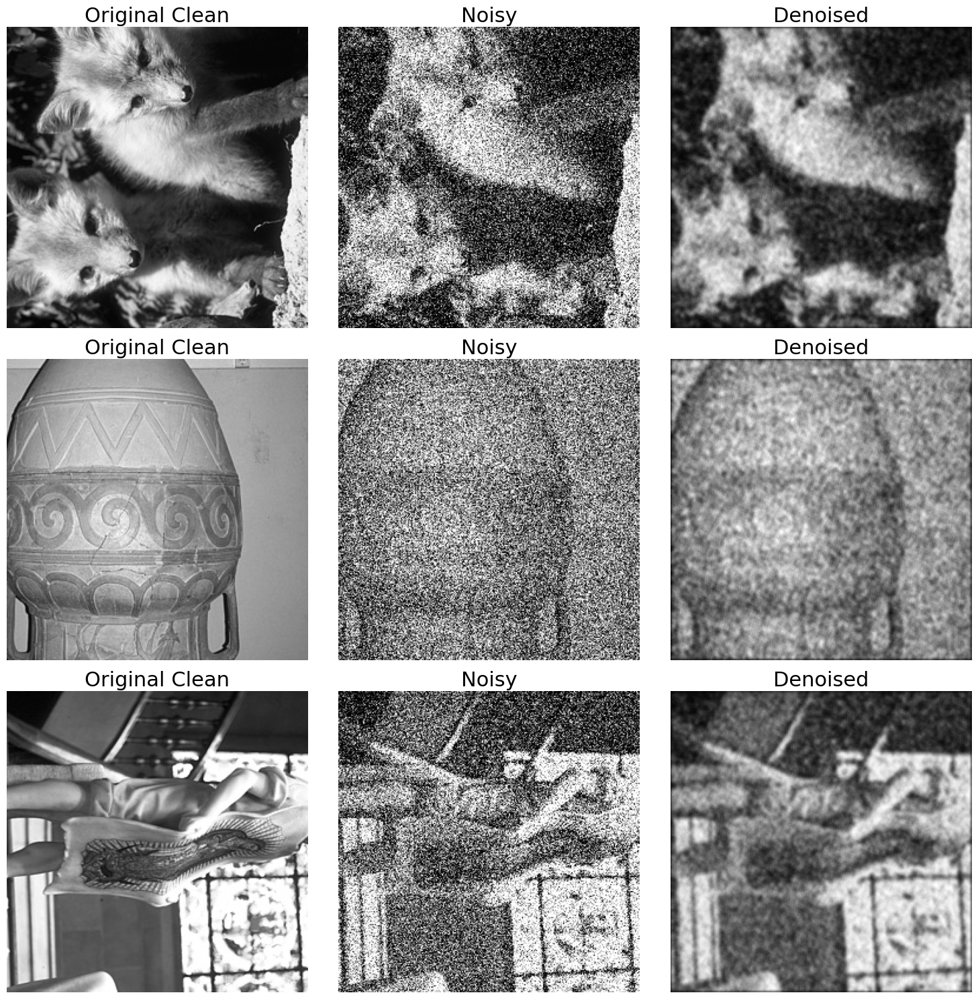

In [7]:
# CNN control model 
CNN = DenoisingCNN(in_ch=1, out_ch=1, kernel_size=3, device='cuda')

criterion = nn.MSELoss()
optimizer = optim.Adam(CNN.parameters(), lr=0.001)
num_epochs = 10
train_denoising_model(CNN, noisybsd68.train_loader, criterion, optimizer, num_epochs, device='cuda')
evaluate_denoising_accuracy(CNN, noisybsd68.test_loader, criterion, device='cuda')
evaluate_accuracy_psnr(CNN, noisybsd68.test_loader, criterion, device='cuda')


# Print out output of trained model
test_denoise_visual_BSD(CNN, noisybsd68.test_data, device='cuda')


## Branching Model

Epoch 1, Time: 1.6680667400360107, Loss: 0.06985106212752205
Epoch 2, Time: 1.3664677143096924, Loss: 0.04606195645672934
Epoch 3, Time: 1.3551952838897705, Loss: 0.024370695065174783
Epoch 4, Time: 1.352696180343628, Loss: 0.022049635914819583
Epoch 5, Time: 1.355072021484375, Loss: 0.018688471322613105
Epoch 6, Time: 1.3429198265075684, Loss: 0.016970652554716383
Epoch 7, Time: 1.347057819366455, Loss: 0.015395098099751132
Epoch 8, Time: 1.3449392318725586, Loss: 0.014148027103926455
Epoch 9, Time: 1.3478081226348877, Loss: 0.013558246195316315
Epoch 10, Time: 1.3410379886627197, Loss: 0.013298289983400277

 Average epoch time: 1.3821260929107666
Average loss on test set: 0.013866565190255642
Average PSNR on test set: 19.077775955200195


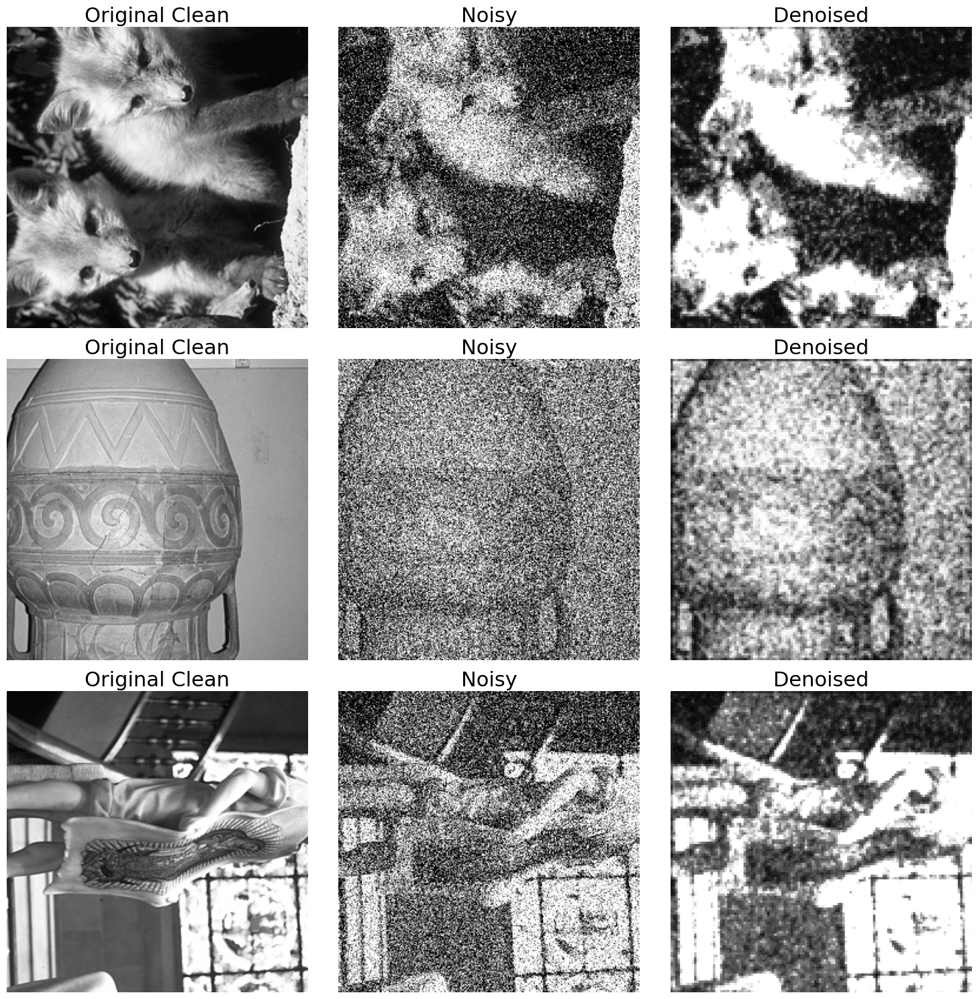

In [8]:
# Denoising Branching CNN + ConvNN Spatial, K = 9, N = 6 (36), 16:16
denoisingbranching_convNN_spatial_K_N_16_16 = DenoisingBranching_ConvNN_2D_Spatial_K_N(in_ch=1, out_ch=1, K=9, N=6, device='cuda')

criterion = nn.MSELoss()
optimizer = optim.Adam(denoisingbranching_convNN_spatial_K_N_16_16.parameters(), lr=0.001)
num_epochs = 10
train_denoising_model(denoisingbranching_convNN_spatial_K_N_16_16, noisybsd68.train_loader, criterion, optimizer, num_epochs, device='cuda')
evaluate_denoising_accuracy(denoisingbranching_convNN_spatial_K_N_16_16, noisybsd68.test_loader, criterion, device='cuda')
evaluate_accuracy_psnr(denoisingbranching_convNN_spatial_K_N_16_16, noisybsd68.test_loader, criterion, device='cuda')

# Print out output of trained model
test_denoise_visual_BSD(denoisingbranching_convNN_spatial_K_N_16_16, noisybsd68.test_data, device='cuda')


## ERROR spatial branching is not working now -> figure out why



Epoch 1, Time: 1.663668155670166, Loss: 0.05333364063075611
Epoch 2, Time: 1.2693521976470947, Loss: 0.035710089440856664
Epoch 3, Time: 1.2640752792358398, Loss: 0.029867727575557574
Epoch 4, Time: 1.2661747932434082, Loss: 0.0262472571006843
Epoch 5, Time: 1.2607121467590332, Loss: 0.02294297463127545
Epoch 6, Time: 1.2665622234344482, Loss: 0.020665285842759267
Epoch 7, Time: 1.2582199573516846, Loss: 0.019836925502334322
Epoch 8, Time: 1.26426362991333, Loss: 0.01810545820210661
Epoch 9, Time: 1.2616972923278809, Loss: 0.018282397517136166
Epoch 10, Time: 1.2664828300476074, Loss: 0.017137603568179265

 Average epoch time: 1.3041208505630493
Average loss on test set: 0.016193127259612083
Average PSNR on test set: 18.46175193786621


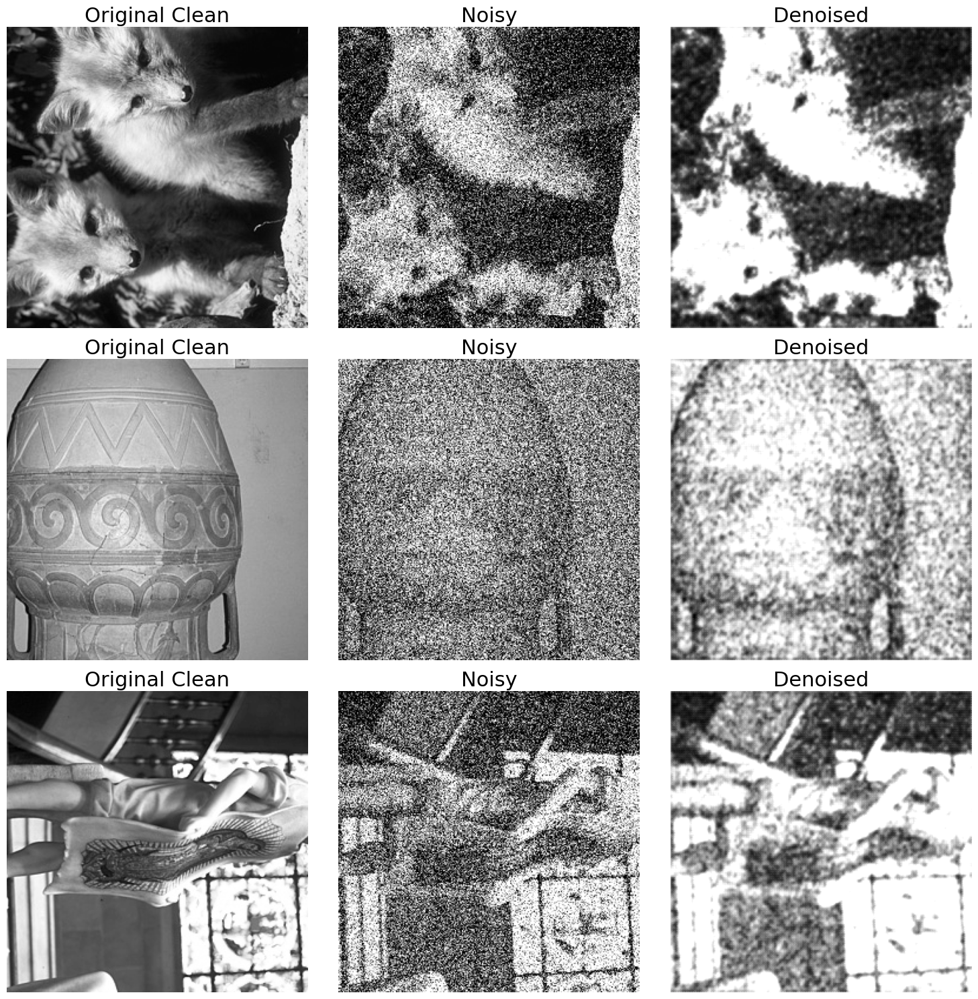

In [9]:
# Denoising Branching CNN + ConvNN Spatial, K = 9, N = 36, 16:16
denoisingbranching_convNN_K_N_16_16 = DenoisingBranching_ConvNN_2D_K_N(in_ch=1, out_ch=1, K=9, N=36, device='cuda')

criterion = nn.MSELoss()
optimizer = optim.Adam(denoisingbranching_convNN_K_N_16_16.parameters(), lr=0.001)
num_epochs = 10 
train_denoising_model(denoisingbranching_convNN_K_N_16_16, noisybsd68.train_loader, criterion, optimizer, num_epochs, device='cuda')
evaluate_denoising_accuracy(denoisingbranching_convNN_K_N_16_16, noisybsd68.test_loader, criterion, device='cuda')
evaluate_accuracy_psnr(denoisingbranching_convNN_K_N_16_16, noisybsd68.test_loader, criterion, device='cuda')

# Print out output of trained model
test_denoise_visual_BSD(denoisingbranching_convNN_K_N_16_16, noisybsd68.test_data, device='cuda')



Epoch 1, Time: 1.203150987625122, Loss: 0.08535736533147949
Epoch 2, Time: 1.2047255039215088, Loss: 0.050062725586550574
Epoch 3, Time: 1.208259105682373, Loss: 0.04764551829014506
Epoch 4, Time: 1.2077314853668213, Loss: 0.04407503083348274
Epoch 5, Time: 1.197831630706787, Loss: 0.04097299011690276
Epoch 6, Time: 1.2008960247039795, Loss: 0.03677053696342877
Epoch 7, Time: 1.2077229022979736, Loss: 0.03147797818694796
Epoch 8, Time: 1.2145864963531494, Loss: 0.03006304720682757
Epoch 9, Time: 1.205174207687378, Loss: 0.029251259618571827
Epoch 10, Time: 1.202134609222412, Loss: 0.027645079951201166

 Average epoch time: 1.2052212953567505
Average loss on test set: 0.030674713663756847
Average PSNR on test set: 15.124199867248535


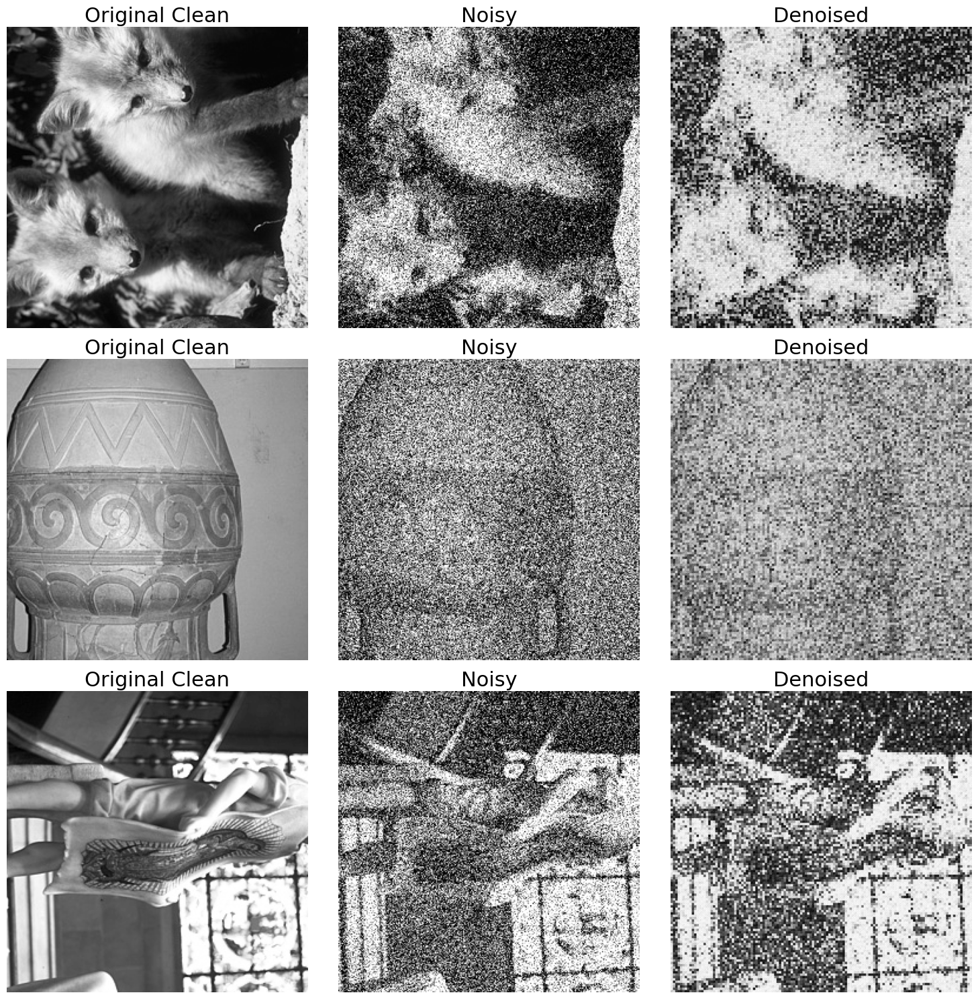

In [10]:
# ConvNN K = 9, N = 36
denoising_convNN_2D_K_N = DenoisingConvNN_2D_K_N(in_ch=1, out_ch=1, K=9, N=36, device='cuda')

criterion = nn.MSELoss()
optimizer = optim.Adam(denoising_convNN_2D_K_N.parameters(), lr=0.001)
num_epochs = 10 
train_denoising_model(denoising_convNN_2D_K_N, noisybsd68.train_loader, criterion, optimizer, num_epochs, device='cuda')
evaluate_denoising_accuracy(denoising_convNN_2D_K_N, noisybsd68.test_loader, criterion, device='cuda')
evaluate_accuracy_psnr(denoising_convNN_2D_K_N, noisybsd68.test_loader, criterion, device='cuda')

# Print out output of trained model
test_denoise_visual_BSD(denoising_convNN_2D_K_N, noisybsd68.test_data, device='cuda')

